***CLASSIFICAÇÃO FEW-SHOT DE DOENÇAS DE PLANTAS VIA FUSÃO DE CARACTERÍSTICAS GLOBAL-LOCAL***

---

Este trabalho implementa uma abordagem de Aprendizado com Poucos Exemplos (Few-Shot Learning – FSL) baseada no método de Fusão de Características Global-Local, inspirado no artigo *Few-Shot Image Classification Algorithm Based on Global–Local Feature Fusion* (Zhang et al., 2025). O objetivo é classificar doenças de plantas utilizando poucas imagens de treinamento por classe.

Foi adotado um cenário **5-way 5-shot**: o modelo aprende a distinguir 5 doenças utilizando apenas 5 imagens de suporte de cada uma. O método combina duas escalas de análise: um ramo **global** (formato e estrutura geral da folha) e um ramo **local** (recortes focados em textura, nervuras e lesões), fundidos por um mecanismo de **Self-Attention** que aprende a dar mais peso às regiões mais relevantes para o diagnóstico. A classificação final usa **Protótipos de Classe** (média das características do suporte) e **distância euclidiana**.


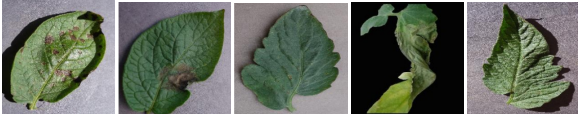


***CÉLULA 1 – Criação da Estrutura do Experimento***

---

Cria a estrutura de diretórios usada no experimento, organizando os conjuntos de **Support Set** (exemplos que representam cada classe) e **Query Set** (imagens usadas para avaliar a generalização do modelo).


In [2]:
import os

# Definindo os caminhos das pastas para o Cenário Few-Shot (Meta-Teste)
base_dir = "projeto_few_shot"
meta_test_dir = os.path.join(base_dir, "meta_test")
support_dir = os.path.join(meta_test_dir, "support")
query_dir = os.path.join(meta_test_dir, "query")

folders_to_create = [support_dir, query_dir]

for folder in folders_to_create:
    os.makedirs(folder, exist_ok=True)
    print(f"Pasta criada com sucesso: {folder}")


Pasta criada com sucesso: projeto_few_shot/meta_test/support
Pasta criada com sucesso: projeto_few_shot/meta_test/query


***CÉLULA 2 – Preparação do Conjunto de Dados***

---

Baixa e descompacta o **PlantVillage**, dataset público com mais de 50 mil imagens de folhas saudáveis e doentes de diversas espécies. É dele que serão extraídas as 5 classes de doenças usadas no experimento.


In [3]:
import zipfile
import urllib.request
import shutil

url = "https://github.com/spMohanty/PlantVillage-Dataset/archive/refs/heads/master.zip"
zip_path = "plantvillage.zip"

print("Baixando dataset de Doenças de Plantas (PlantVillage)...")
urllib.request.urlretrieve(url, zip_path)

print("Descompactando os arquivos...")
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall("plantvillage_raw")

print("Dataset descompactado com sucesso!")


Baixando dataset de Doenças de Plantas (PlantVillage)...
Descompactando os arquivos...
Dataset descompactado com sucesso!


***CÉLULA 3 – Construção do Cenário Few-Shot (5-way 5-shot)***

---

Seleciona as 5 doenças que participarão do experimento e separa, para cada uma:
- **5 imagens de suporte** (o "5-shot");
- **100 imagens de consulta**, usadas depois para testar a generalização do modelo.

O `random.seed(42)` garante que o sorteio seja sempre o mesmo, tornando o experimento repetível.


In [4]:
import glob
import random
import shutil
import os

raw_data_path = "plantvillage_raw/PlantVillage-Dataset-master/raw/color/"

# 5 Doenças para testar a generalização
classes_escolhidas = [
    "Tomato___Bacterial_spot",
    "Tomato___Late_blight",
    "Tomato___healthy",
    "Potato___Early_blight",
    "Potato___Late_blight"
]

K_SHOT = 5       # 5 fotos de exemplo no suporte
NUM_QUERY = 100  # 100 fotos de teste por doença

# Limpa execuções antigas para não misturar dados de rodadas diferentes
if os.path.exists(support_dir): shutil.rmtree(support_dir)
if os.path.exists(query_dir): shutil.rmtree(query_dir)

for classe in classes_escolhidas:
    os.makedirs(os.path.join(support_dir, classe), exist_ok=True)
    os.makedirs(os.path.join(query_dir, classe), exist_ok=True)

    imagens = glob.glob(os.path.join(raw_data_path, classe, "*.JPG")) + glob.glob(os.path.join(raw_data_path, classe, "*.jpg"))
    random.seed(42)  # Garante repetibilidade do sorteio
    random.shuffle(imagens)

    for i in range(K_SHOT):
        shutil.copy(imagens[i], os.path.join(support_dir, classe, os.path.basename(imagens[i])))

    for i in range(K_SHOT, K_SHOT + NUM_QUERY):
        shutil.copy(imagens[i], os.path.join(query_dir, classe, os.path.basename(imagens[i])))

print(f"Cenário Few-Shot montado: {len(classes_escolhidas)} classes (doenças).")
print(f"Total de imagens que serão testadas: {len(classes_escolhidas) * NUM_QUERY}")


Cenário Few-Shot montado: 5 classes (doenças).
Total de imagens que serão testadas: 500


***CÉLULA 4 – Implementação do Modelo Global-Local***

---

Implementa a arquitetura de classificação, composta por:
- **Backbone ResNet-18** pré-treinada (congelada, usada só como extratora de características);
- **Ramo Global**: características da imagem inteira;
- **Ramo Local**: características de **4 recortes aleatórios** por imagem;
- **Self-Attention**: combina os 4 recortes locais, aprendendo a dar mais peso às regiões mais relevantes (ex.: a lesão da doença) e suprimir o fundo;
- **Classificador Prototípico**: cada classe é representada pela média dos vetores de suporte; a imagem de consulta é atribuída à classe cujo protótipo está mais próximo (distância euclidiana).

**Como funciona o corte local (`RandomResizedCrop`):** para cada imagem, o modelo sorteia 4 recortes. Cada recorte cobre entre 50% e 100% da área da imagem original, em uma posição aleatória, e é redimensionado para 84×84 pixels. Isso faz o modelo "olhar" para a mesma folha em diferentes níveis de zoom — às vezes captando a folha quase inteira, às vezes só um detalhe (nervura, borda, lesão) — complementando a visão global com detalhes que ficariam diluídos numa análise da imagem completa.


In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image

class GlobalLocalFewShotModel(nn.Module):
    def __init__(self, num_patches=4, embed_dim=512):
        super(GlobalLocalFewShotModel, self).__init__()
        self.num_patches = num_patches

        resnet = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
        self.backbone = nn.Sequential(*list(resnet.children())[:-1])

        for param in self.backbone.parameters():
            param.requires_grad = False

        # Recorte local aleatório: 50%-100% da área da imagem, redimensionado para 84x84
        self.local_crop = transforms.RandomResizedCrop(size=(84, 84), scale=(0.5, 1.0))
        self.self_attention = nn.MultiheadAttention(embed_dim=embed_dim, num_heads=4, batch_first=True)

        # Inicializa Q, K, V e a projeção de saída como identidade
        with torch.no_grad():
            I = torch.eye(embed_dim)
            self.self_attention.in_proj_weight.copy_(torch.cat([I, I, I], dim=0))
            self.self_attention.in_proj_bias.zero_()
            self.self_attention.out_proj.weight.copy_(I)
            self.self_attention.out_proj.bias.zero_()

    def forward(self, x):
        with torch.no_grad():
            R_g = self.backbone(x)
        R_g = F.normalize(R_g.view(R_g.size(0), -1), p=2, dim=-1)

        local_features = []
        for _ in range(self.num_patches):
            patch = self.local_crop(x)
            with torch.no_grad():
                R_l_n = self.backbone(patch)
            local_features.append(F.normalize(R_l_n.view(R_l_n.size(0), 1, -1), p=2, dim=-1))

        local_features = torch.cat(local_features, dim=1)
        attn_output, _ = self.self_attention(local_features, local_features, local_features)
        R_w = F.normalize(torch.mean(attn_output, dim=1), p=2, dim=-1)

        return F.normalize(torch.cat((R_g, R_w), dim=-1), p=2, dim=-1)

def compute_prototype_and_classify(support_features, support_labels, query_feature):
    unique_classes = torch.unique(support_labels)
    prototypes = {}
    for c in unique_classes:
        class_mask = (support_labels == c)
        prototypes[c.item()] = torch.mean(support_features[class_mask], dim=0)

    best_class, min_distance = None, float('inf')
    for c, proto in prototypes.items():
        dist = torch.dist(query_feature, proto, p=2)
        if dist < min_distance:
            min_distance = dist
            best_class = c
    return best_class

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = GlobalLocalFewShotModel().to(device)
model.eval()
print("Modelo criado com sucesso!")


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 139MB/s]


Modelo criado com sucesso!


***VISUALIZADOR DAS IMAGENS***

---

Mostra uma amostra de cada uma das 5 classes do conjunto de consulta, apenas para conferir visualmente que os dados foram carregados corretamente antes de rodar a avaliação.


IMAGENS DO CONJUNTO DE CONSULTA (QUERY) QUE SERÃO ANALISADAS PELO MODELO:
--------------------------------------------------------------------------------


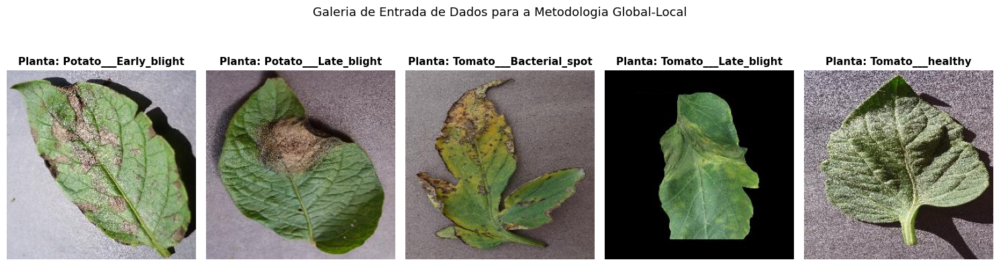

In [6]:
import matplotlib.pyplot as plt
import glob
from PIL import Image
import os

print("IMAGENS DO CONJUNTO DE CONSULTA (QUERY) QUE SERÃO ANALISADAS PELO MODELO:")
print("-" * 80)

pastas_plantas = sorted(glob.glob(os.path.join(query_dir, "*")))
plt.figure(figsize=(15, 4))

for idx, pasta in enumerate(pastas_plantas):
    nome_planta = os.path.basename(pasta)

    all_images_in_folder = glob.glob(os.path.join(pasta, "*.jpg")) + glob.glob(os.path.join(pasta, "*.JPG"))

    if all_images_in_folder:
        primeira_img = all_images_in_folder[0]
    else:
        print(f"Aviso: Nenhuma imagem .jpg ou .JPG encontrada na pasta: {pasta}. Pulando esta pasta.")
        continue

    img = Image.open(primeira_img)

    plt.subplot(1, 5, idx + 1)
    plt.imshow(img)
    plt.title(f"Planta: {nome_planta}", fontsize=11, weight='bold')
    plt.axis('off')

plt.suptitle("Galeria de Entrada de Dados para a Metodologia Global-Local", fontsize=13, y=1.05)
plt.tight_layout()
plt.show()


***CÉLULA 5 – Avaliação do Modelo***

---

Calcula os protótipos de cada classe a partir das 5 imagens de suporte, classifica as 500 imagens de consulta e reporta as métricas de desempenho: Precisão, Recall, F1-Score, Acurácia e Matriz de Confusão (com 5 exemplos de acerto/erro ilustrados ao lado).



TESTE DE GENERALIZAÇÃO
Total de Folhas Avaliadas:     500
Diagnósticos CORRETOS (Acertos): 429 ✅
Diagnósticos INCORRETOS (Erros): 71 ❌

                       precision    recall  f1-score   support

  Potato Early_blight       0.96      0.89      0.92       100
   Potato Late_blight       0.73      0.93      0.82       100
Tomato Bacterial_spot       0.89      0.80      0.84       100
   Tomato Late_blight       0.79      0.77      0.78       100
       Tomato healthy       0.99      0.90      0.94       100

             accuracy                           0.86       500
            macro avg       0.87      0.86      0.86       500
         weighted avg       0.87      0.86      0.86       500



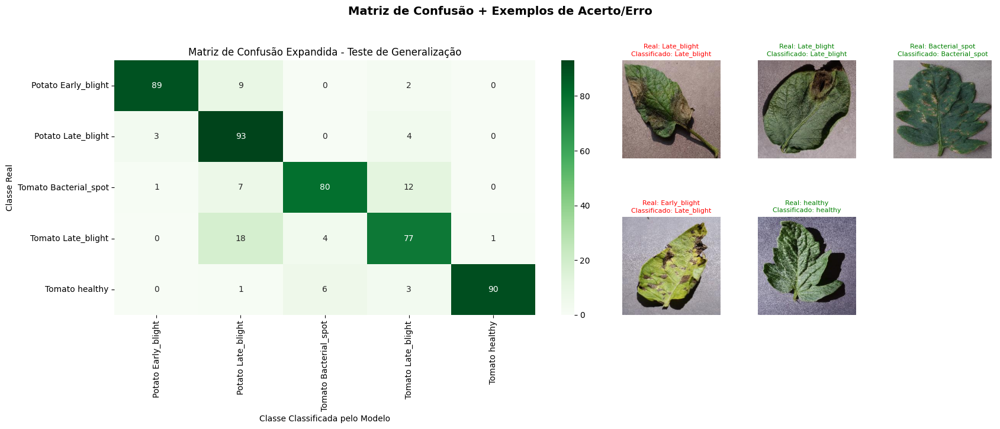

In [7]:
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix

eval_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

support_dataset = ImageFolder("projeto_few_shot/meta_test/support", transform=eval_transform)
query_dataset = ImageFolder("projeto_few_shot/meta_test/query", transform=eval_transform)

support_loader = DataLoader(support_dataset, batch_size=len(support_dataset), shuffle=False)
query_loader = DataLoader(query_dataset, batch_size=1, shuffle=False)

for images, labels in support_loader:
    images, labels = images.to(device), labels.to(device)
    with torch.no_grad():
        support_features = model(images)
    support_labels = labels

y_true = []
y_pred = []

for query_img, query_label in query_loader:
    query_img = query_img.to(device)
    with torch.no_grad():
        query_feature = model(query_img).squeeze(0)

    classe_predita = compute_prototype_and_classify(support_features, support_labels, query_feature)
    y_true.append(query_label.item())
    y_pred.append(classe_predita)

# CÁLCULO DE QUANTIDADE ABSOLUTA
y_true_np = np.array(y_true)
y_pred_np = np.array(y_pred)
total_acertos = np.sum(y_true_np == y_pred_np)
total_erros = len(y_true) - total_acertos

print("\n=======================================================")
print("TESTE DE GENERALIZAÇÃO")
print("=======================================================")
print(f"Total de Folhas Avaliadas:     {len(y_true)}")
print(f"Diagnósticos CORRETOS (Acertos): {total_acertos} ✅")
print(f"Diagnósticos INCORRETOS (Erros): {total_erros} ❌")
print("=======================================================\n")

class_names_clean = [c.replace("___", " ").replace("__", " ") for c in query_dataset.classes]
print(classification_report(y_true, y_pred, target_names=class_names_clean))

cm = confusion_matrix(y_true, y_pred)

# --- Seleciona até 5 exemplos (mistura de acertos e erros) para ilustrar ---
exemplos_corretos = [i for i in range(len(y_true)) if y_true[i] == y_pred[i]]
exemplos_errados  = [i for i in range(len(y_true)) if y_true[i] != y_pred[i]]

random.seed(42)
random.shuffle(exemplos_corretos)
random.shuffle(exemplos_errados)

n_errados = min(2, len(exemplos_errados))
n_corretos = min(5 - n_errados, len(exemplos_corretos))
indices_exemplo = exemplos_corretos[:n_corretos] + exemplos_errados[:n_errados]
random.shuffle(indices_exemplo)

# --- Figura combinada: matriz (esquerda) + exemplos (direita, 3 em cima / 3 em baixo) ---
fig = plt.figure(figsize=(17, 7))
gs = fig.add_gridspec(1, 2, width_ratios=[1.4, 1])

ax_cm = fig.add_subplot(gs[0, 0])
sns.heatmap(cm, annot=True, fmt='d', cmap='Greens',
            xticklabels=class_names_clean, yticklabels=class_names_clean, ax=ax_cm)
ax_cm.set_title('Matriz de Confusão Expandida - Teste de Generalização')
ax_cm.set_ylabel('Classe Real')
ax_cm.set_xlabel('Classe Classificada pelo Modelo')

gs_imgs = gs[0, 1].subgridspec(2, 3, wspace=0.3, hspace=0.6)
for slot in range(6):
    row, col = divmod(slot, 3)
    ax = fig.add_subplot(gs_imgs[row, col])
    ax.axis('off')
    if slot < len(indices_exemplo):
        idx = indices_exemplo[slot]
        img_path, classe_id = query_dataset.samples[idx]
        pred = y_pred[idx]
        nome_real = query_dataset.classes[classe_id].split("___")[-1]
        nome_predito = query_dataset.classes[pred].split("___")[-1]
        cor = 'green' if pred == classe_id else 'red'
        ax.imshow(Image.open(img_path))
        ax.set_title(f"Real: {nome_real}\nClassificado: {nome_predito}", fontsize=8, color=cor)

fig.suptitle("Matriz de Confusão + Exemplos de Acerto/Erro", fontsize=14, weight='bold', y=1.03)
plt.tight_layout()
plt.show()


***CÉLULA 6 – Visualização dos Resultados por Classe***

---

Para cada uma das 5 doenças, monta uma grade com todas as imagens de consulta correspondentes, destacando em **verde** os acertos e em **vermelho** os erros, junto com a classe prevista pelo modelo.


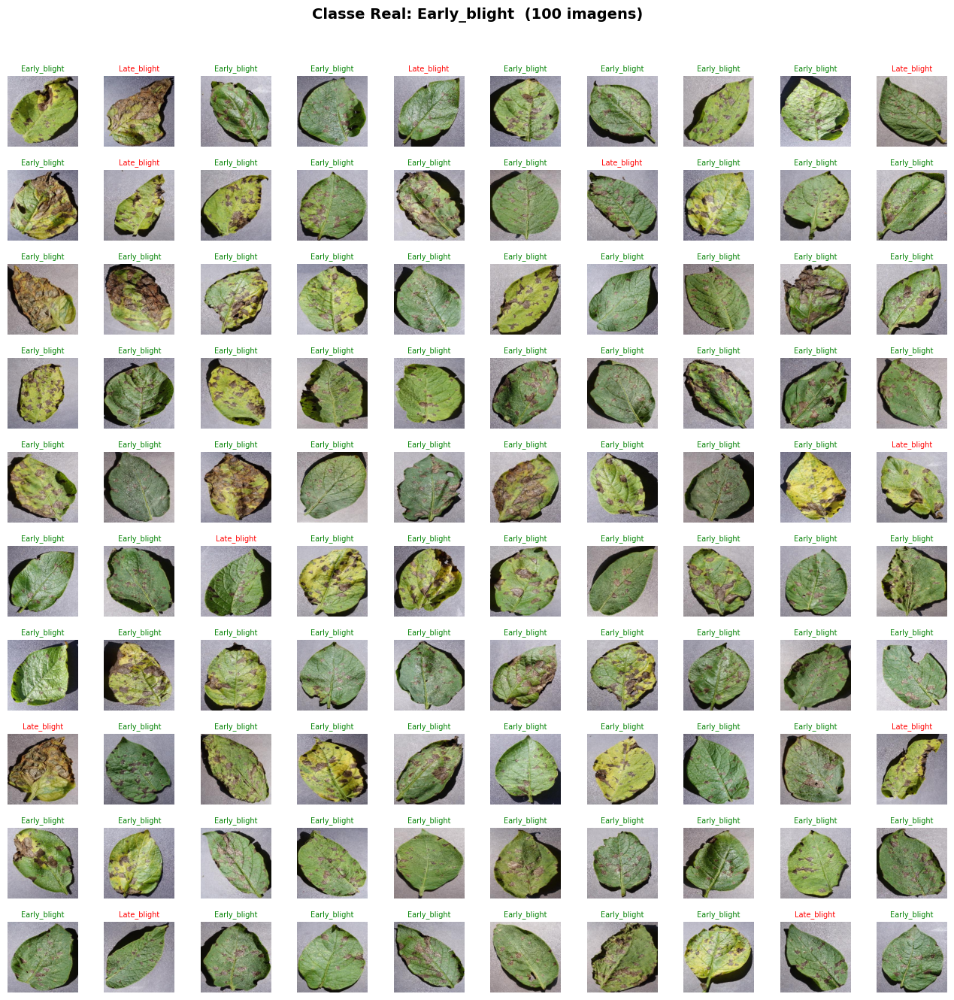

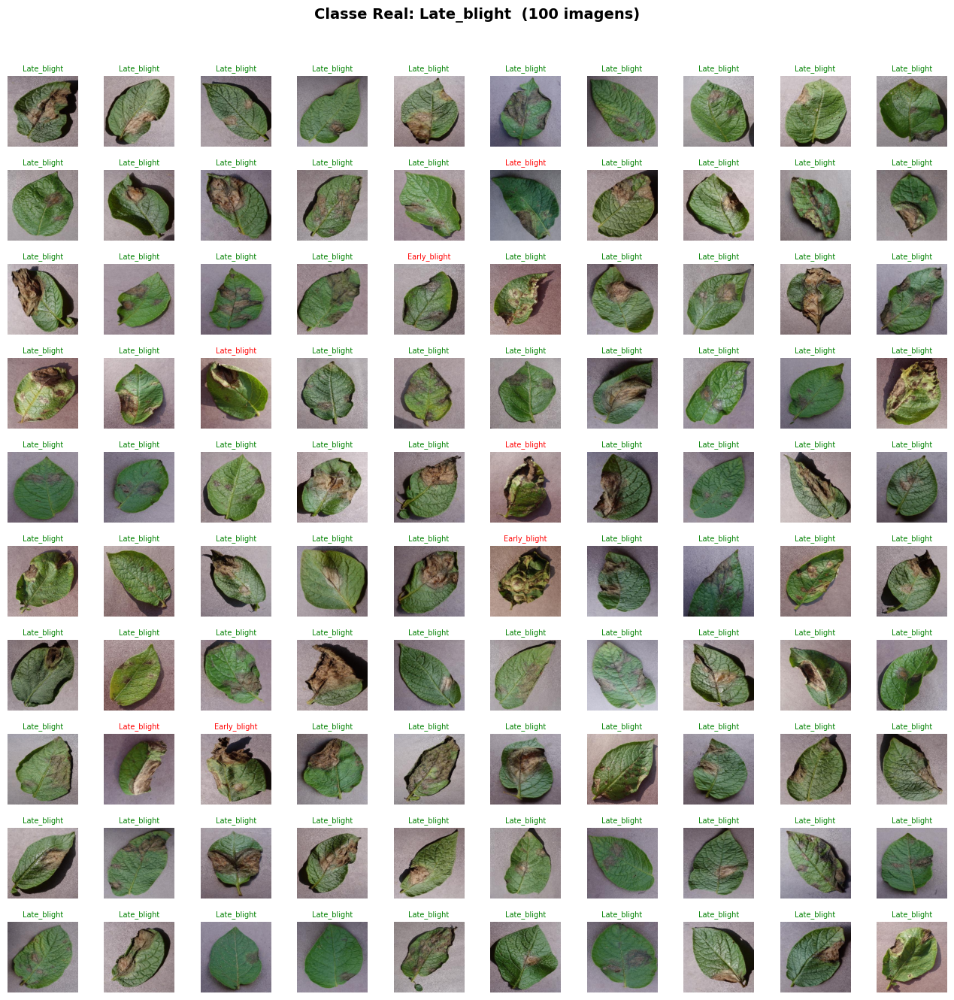

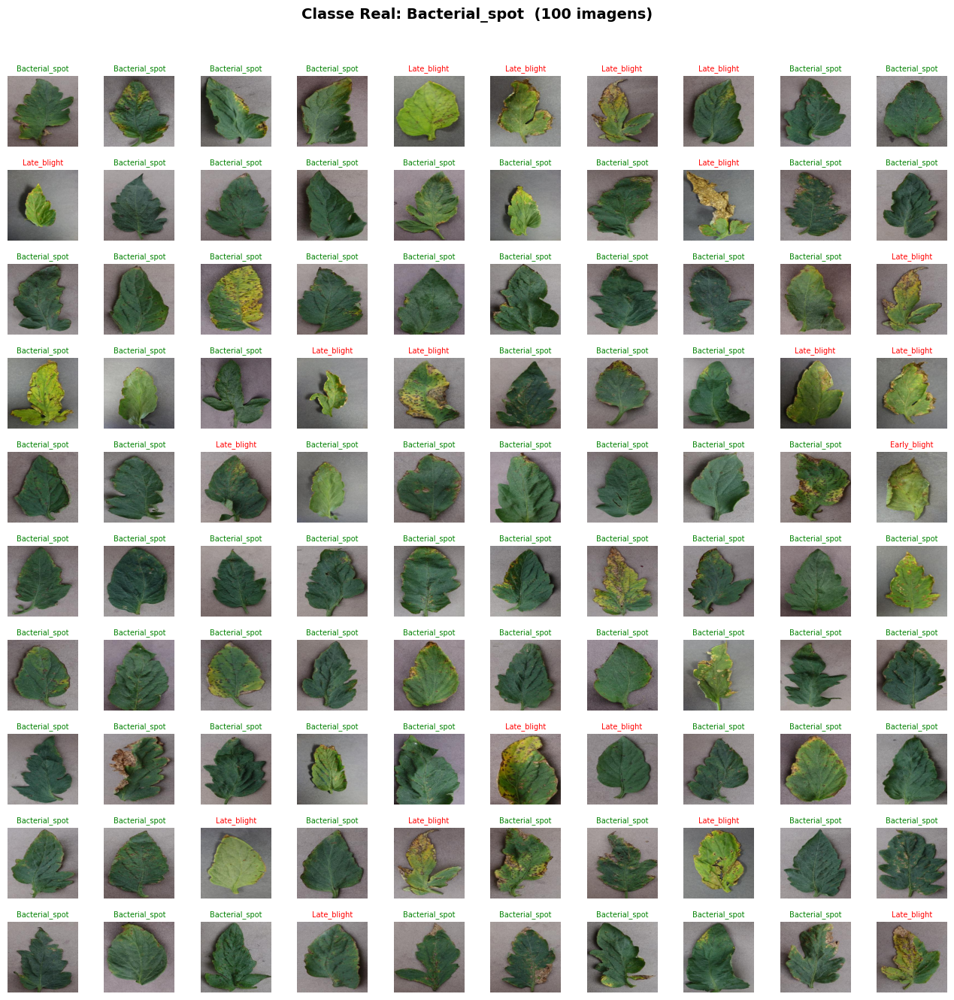

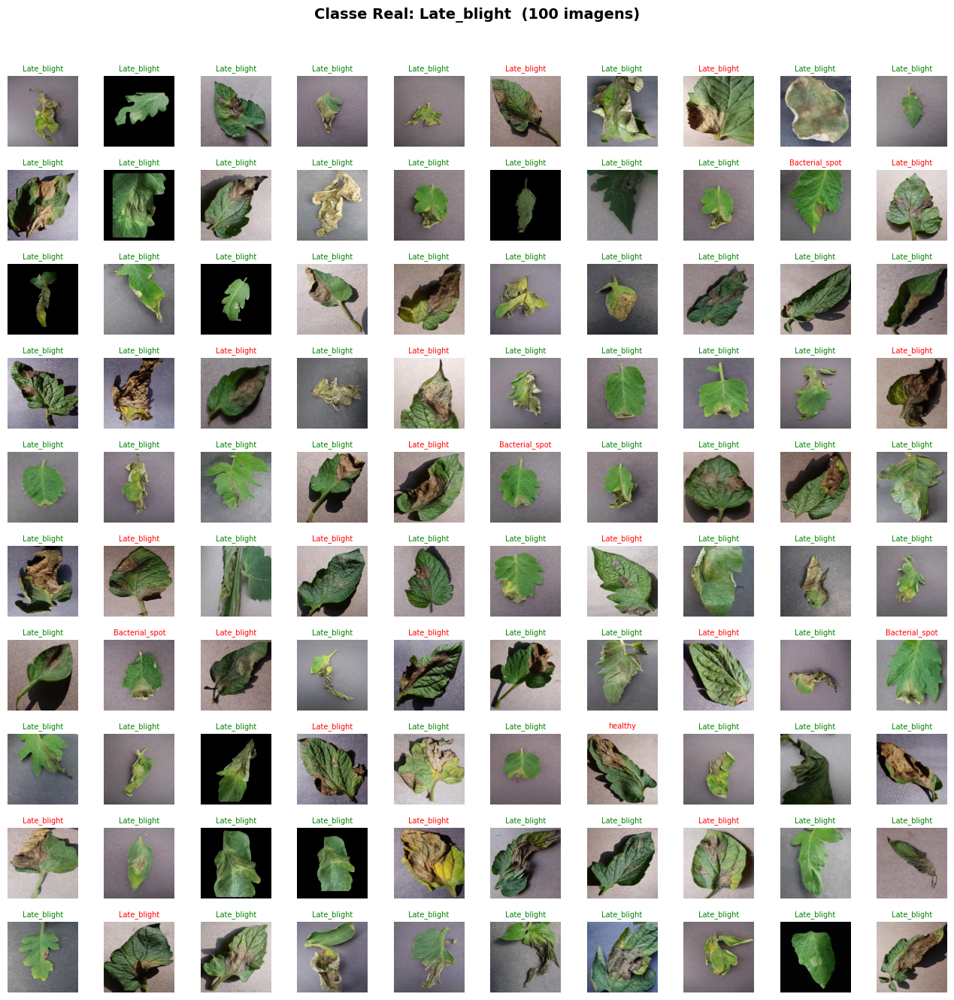

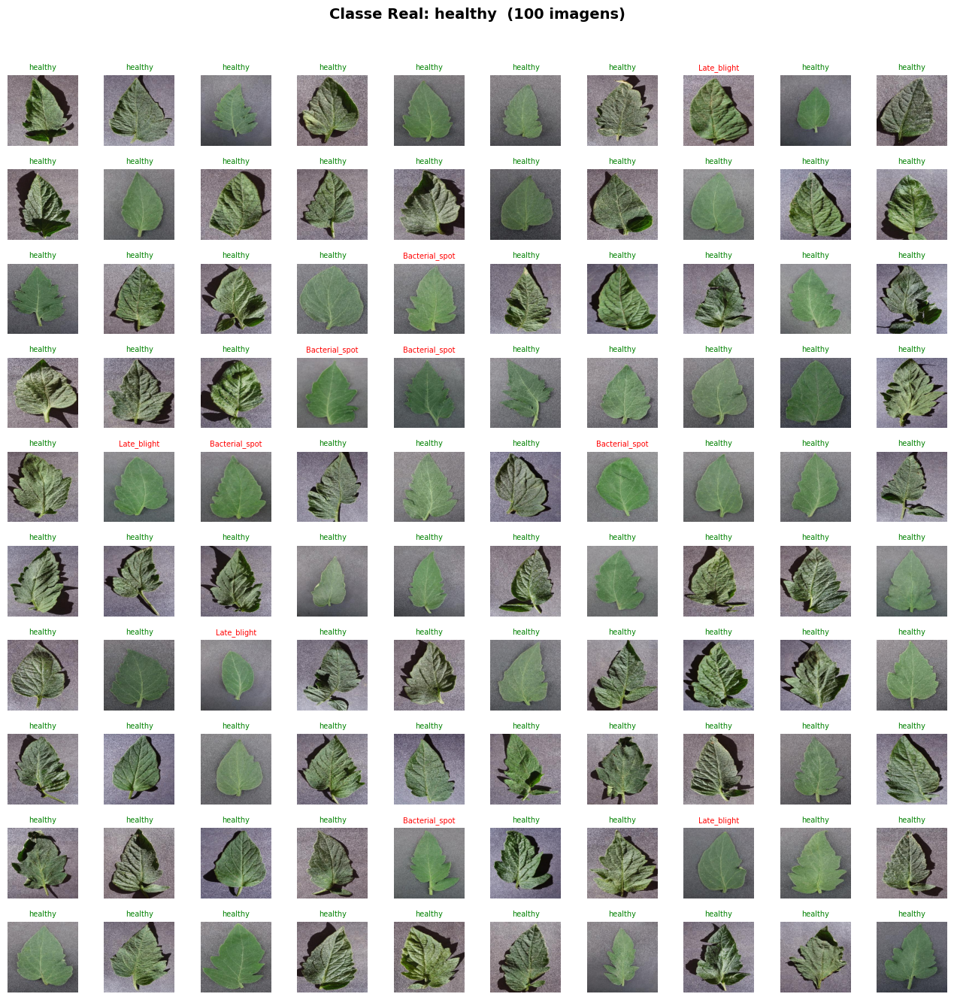

In [8]:
import math

for classe_id, nome_classe_completo in enumerate(query_dataset.classes):
    amostras_da_classe = [(query_dataset.samples[i][0], y_true[i], y_pred[i])
                           for i in range(len(y_true)) if y_true[i] == classe_id]
    n = len(amostras_da_classe)
    cols = 10
    rows = math.ceil(n / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 1.3, rows * 1.3))
    fig.suptitle(f"Classe Real: {nome_classe_completo.split('___')[-1]}  ({n} imagens)",
                 fontsize=14, weight='bold', y=1.02)

    for i, ax in enumerate(axes.flat):
        ax.axis('off')
        if i < n:
            img_path, classe_real, pred = amostras_da_classe[i]
            nome_predito = query_dataset.classes[pred].split("___")[-1]
            cor = 'green' if pred == classe_real else 'red'
            ax.imshow(Image.open(img_path))
            ax.set_title(nome_predito, fontsize=7, color=cor)
            for spine in ax.spines.values():
                spine.set_visible(True)
                spine.set_edgecolor(cor)
                spine.set_linewidth(2)

    plt.tight_layout()
    plt.show()
